[![GitHub issues by-label](https://img.shields.io/github/issues-raw/pfebrer/sisl/BandsPlot?style=for-the-badge)](https://github.com/pfebrer/sisl/labels/BandsPlot)

    
    
BandsPlot 
=========

In [1]:
import sisl
import sisl.viz
# This is just for convenience to retreive files
siesta_files = sisl._environ.get_environ_variable("SISL_FILES_TESTS") / "sisl" / "io" / "siesta"

Let's get a bands_plot from a `.bands` file

In [2]:
bands_plot = sisl.get_sile( siesta_files / "SrTiO3.bands").plot()

and see what we've got:

In [3]:
bands_plot

## Getting the bands that you want

By default, `BandsPlot` gives you **the 15 bands below and above 0 eV** (which is interpreted as the fermi level). 

There are two main ways to specify the bands that you want to display: `Erange` and `bands_range`.

As you may have guessed, `Erange` specifies the energy range that is displayed:

In [4]:
bands_plot.update_inputs(Erange=[-10, 10])

while with `bands_range` you can actually indicate the indices.

However, note that **`Erange` has preference over `bands_range`**, therefore you need to set `Erange` to `None` if you want the change to take effect.

In [5]:
bands_plot.update_inputs(bands_range=[6, 15], Erange=None)

If your fermi level is not correctly set or you want a different energy reference, you can provide a value for `E0` to specify where your 0 should be and the bands to display will be automatically calculated from that. 

However, if you want to update `E0` after the plot has been build and you want `BandsPlot` to recalculate the bands for you you will need to set `Erange` and `bands_range` to `None` again.

In [6]:
bands_plot.update_inputs(E0=-10, bands_range=None, Erange=None)

Notice how only 25 bands are displayed now: the only 10 that are below 0 eV (there are no lower states) and 15 above 0 eV.

In [7]:
# Set them back to "normal"
bands_plot = bands_plot.update_inputs(E0=0, bands_range=None, Erange=None)

Notice that in spin polarized bands, **you can select the spins to display using the `spin` setting**, just pass a list of spin components (e.g. `spin=[0]`).

## Bands styling

If all you want is to change the color and width of the bands, there's one simple solution: use the `bands_style` input to tweak the line styles.

Let's show them in red:

In [8]:
bands_plot.update_inputs(bands_style={"color": "red"})

And now in green but also make them wider:

In [9]:
bands_plot.update_inputs(bands_style={"color": "green", "width": 3})

If you have spin polarized bands, `bands_style` will tweak the colors for the first spin channel, while the second one can be tuned with `spindown_style`.

Finally, you can pass functions to the keys of `bands_style` to customize the styles on a band basis, or even on a point basis. The functions should accept `data` as an argument, which will be an `xarray.Dataset` containing all the bands data. It should then return a single value or an array of values. It is best shown with examples. Let's create a function just to see what we receive as an input:

In [10]:
def color(data):
    """Dummy function to see what we receive."""
    print(data)
    return "green"

bands_plot.update_inputs(bands_style={"color": color})

<xarray.Dataset>
Dimensions:  (k: 150, band: 32)
Coordinates:
  * k        (k) float64 0.0 0.01951 0.03901 0.05852 ... 2.76 2.779 2.797 2.815
  * band     (band) int32 4 5 6 7 8 9 10 11 12 13 ... 27 28 29 30 31 32 33 34 35
Data variables:
    E        (k, band) float64 -33.03 -17.91 -16.81 -16.81 ... 18.02 18.02 20.01
Attributes:
    spin:     Spin{unpolarized, kind=f}


So, you can see that we receive a `Dataset`. The most important variable is `E`, which contains the energy (that depends on `k` and `band`). Let's now play with it to do some custom styling:
- The **color** will be determined by **the slope of the band**.
- We will plot **bands that are closer to the fermi level bigger** because they are more important.

In [11]:
def gradient(data):
    """Function that computes the absolute value of dE/dk.
    
    This returns a two dimensional array (gradient depends on k and band)
    """
    return abs(data.E.differentiate("k"))

def band_closeness_to_Ef(data):
    """Computes how close one band is to the fermi level.
    
    This returns a one dimensional array (distance depends only on band)
    """
    dist_from_Ef = abs(data.E).min("k")
    
    return (1 / dist_from_Ef ** 0.4) * 5

# Now we are going to set the width of the band according to the distance from the fermi level
# and the color according to the gradient. We are going to set the colorscale also, instead of using
# the default one.
bands_plot.update_inputs(
    bands_style={"width": band_closeness_to_Ef, "color": gradient}, 
    colorscale="temps",
    Erange=[-10, 10]
)

You can see that by providing callables the possibilities are endless, you are only limited by your imagination!

In [12]:
bands_plot = bands_plot.update_inputs(bands_style={})

## Displaying the smallest gaps

The easiest thing to do is to let `BandsPlot` discover where the (minimum) gaps are.

This is indicated by setting the `gap` parameter to `True`. One can also use `gap_color` if a particular color is desired.

In [13]:
bands_plot.update_inputs(gap=True, gap_color="green", Erange=[-10,10])

This displays the minimum gaps. However there may be some issues with it: it will show **all** gaps with the minimum value. That is, if you have repeated points in the brillouin zone it will display multiple gaps that are equivalent. 

What's worse, if the region where your gap is is very flat, two consecutive points might have the same energy. Multiple gaps will be displayed one glued to another.

To help cope with this issues, you have the `direct_gaps_only` and `gap_tol`.

In this case, since we have no direct gaps, setting `direct_gaps_only` will hide them all:

In [14]:
bands_plot.update_inputs(direct_gaps_only=True)

This example is not meaningful for `gap_tol`, but it is illustrative of what `gap_tol` does. It is the **minimum k-distance between two points to consider them "the same point"** in the sense that only one of them will be used to show the gap. In this case, if we set `gap_tol` all the way up to 3, the plot will consider the two gamma points to be part of the same "point" and therefore it will only show the gap once.

In [15]:
bands_plot.update_inputs(direct_gaps_only=False, gap_tol=3)

This is not what `gap_tol` is meant for, since it is thought to remediate the effect of locally flat bands, but still you can get the idea of what it does.

In [16]:
bands_plot = bands_plot.update_inputs(gap=False, gap_tol=0.01)

## Displaying custom gaps

If you are not happy with the gaps that the plot is displaying for you or **you simply want gaps that are not the smallest ones**, you can always use `custom_gaps`.

Custom gaps should be a list where each item specifies how to draw that given gap. The key labels of each item are `from` and `to`, which specifies the k-points through which you want to draw the gap. The rest of labels are the typical styling labels: `color`, `width`...

For example, if we want to plot the gamma-gamma gap:

In [17]:
bands_plot.update_inputs(custom_gaps=[{"from": "Gamma", "to": "Gamma", "color": "red"}])

Notice how we got the gap probably not where we wanted, since it would be better to have it in the middle `Gamma` point, which is more visible. Instead of the K point name, you can also pass the K value.

Now, you'll be happy to know that you can easily access the k values of all labels, as they are stored as part of the attributes of the `k` coordinate in the bands dataarray:

In [18]:
bands_plot.nodes['bands_data'].get().k.axis

{'showgrid': True,
 'tickvals': [0.0, 0.429132, 0.858265, 1.465149, 2.208428, 2.815313],
 'ticktext': ['Gamma', 'X', 'M', 'Gamma', 'R', 'X']}

Now all we need to do is to grab the value for the second gamma point:

In [19]:
axis_info = bands_plot.nodes['bands_data'].get().k.axis

gap_k = None
for val, label in zip(axis_info["tickvals"], axis_info["ticktext"]):
    if label == "Gamma":
        gap_k = val
gap_k

1.465149

And use it to build a custom gap:

In [20]:
bands_plot.update_inputs(custom_gaps=[{"from": gap_k, "to": gap_k, "color": "orange"}])

## Displaying spin texture

If your bands plot comes from a non-colinear spin calculation (or is using a `Hamiltonian` with non-colinear spin), you can pass `"x"`, `"y"` or `"z"` to the `spin` setting in order to get a display of the spin texture.

Let's read in a hamiltonian coming from a spin orbit SIESTA calculation, which is obtained from [this fantastic spin texture tutorial](https://github.com/juijan/TopoToolsSiesta/tree/master/Tutorials/Exercise/TI_02):

In [21]:
import sisl
siesta_files = sisl._environ.get_environ_variable("SISL_FILES_TESTS") / "sisl" / "io" / "siesta"

In [22]:
H = sisl.get_sile(siesta_files / "Bi2D_BHex.TSHS").read_hamiltonian()
H.spin.is_spinorbit

True

Generate the path for our band structure:

In [23]:
band_struct = sisl.BandStructure(H, points=[[1./2, 0., 0.], [0., 0., 0.],
                                     [1./3, 1./3, 0.], [1./2, 0., 0.]],
                           divisions=301,
                           names=['M', r'Gamma', 'K', 'M'])

And finally generate the plot:

In [24]:
spin_texture_plot = band_struct.plot.bands(Erange=[-2,2])
spin_texture_plot

Now it's time to add spin texture to these bands. Remember the section on styling bands? If you haven't checked it, take a quick look at it, because it will come handy now. The main point to take from that section for our purpose here is that each key in the styles accepts a callable.

As in other cases through the `sisl.viz` module, we provide callables that will work out of the box for the most common styling. In this case, what we need is the `SpinMoment` node. We will import it and use it simply by specifying the axis.

In [25]:
from sisl.viz.data_sources import SpinMoment

spin_texture_plot.update_inputs(
    bands_style={"color": SpinMoment("x"), "width": 3}
)

# We hide the legend so that the colorbar can be easily seen.
spin_texture_plot.update_layout(showlegend=False) 

There is nothing magic about the `SpinMoment` node. If you pass a dummy callable as we did in the styling section, you will see that the bands data now contains a `spin_moments` variable since it comes from a non-colinear calculation. It is just a matter of grabbing that variable:

In [26]:
def color(data):
    """Dummy function to see what we receive."""
    print(data)
    return "green"

spin_texture_plot.update_inputs(bands_style={"color": color})

<xarray.Dataset>
Dimensions:       (k: 301, band: 56, axis: 3)
Coordinates:
  * band          (band) int32 0 1 2 3 4 5 6 7 8 ... 47 48 49 50 51 52 53 54 55
  * k             (k) float64 0.0 0.007169 0.01434 0.02151 ... 2.14 2.147 2.155
  * axis          (axis) <U1 'x' 'y' 'z'
Data variables:
    E             (k, band) float64 nan nan nan nan nan ... nan nan nan nan nan
    spin_moments  (k, axis, band) float64 -0.2438 0.2441 ... -0.1044 0.1044
Attributes:
    bz:        BandStructure{nk: 301,\n Lattice{nsc: [5 5 1],\n  origin=0.000...
    parent:    Hamiltonian{non-zero: 6476, orthogonal: False,\n Spin{spin-orb...
    spin:      Spin{spin-orbit, kind=f}
    geometry:  Geometry{na: 2, no: 28,\n Atoms{species: 1,\n  Atom{H, Z: 1, m...


Note that, as shown in the styling section, you can use the `colorscale` input to change the colorscale, or use the `SpinMoment` node for the other styling keys. For example, we can set the width of the band to display whether there is some spin moment, and the color can show the sign.

In [27]:
spin_texture_plot.update_inputs(
    bands_style={"color": SpinMoment("x"), "width": abs(SpinMoment("x")) * 40}
).update_layout(showlegend=False)

Notice how we did some postprocessing to adapt the values of the spin moment to some number that is suitable for the width. This is possible thanks to the magic of nodes!

We hope you enjoyed what you learned!

-----
This next cell is just to create the thumbnail for the notebook in the docs 

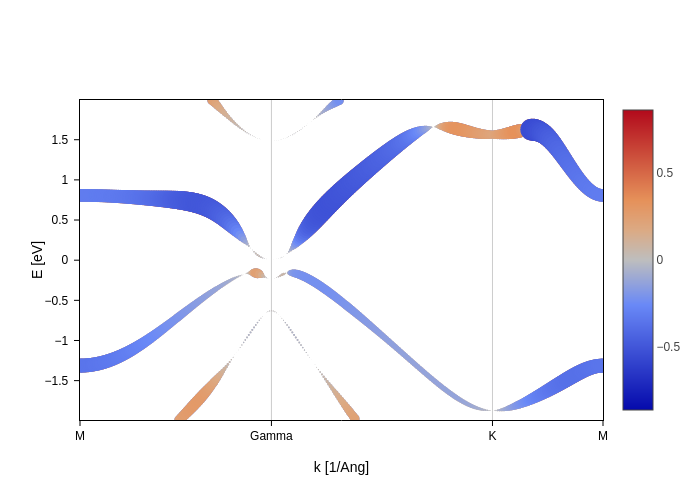

In [28]:
thumbnail_plot = spin_texture_plot

if thumbnail_plot:
    thumbnail_plot.show("png")

-------------